In [379]:
import pandas as pd
import numpy as np
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder

#### Read Weather Data

In [380]:
df = pd.read_csv('weatherAUS.csv')
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


# Explatorary Data Analysis 

In [381]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

#### Data Cleaning

Checking missing values

In [382]:
df.isnull().sum()

Date                 0
Location             0
MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustDir      10326
WindGustSpeed    10263
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
RainToday         3261
RainTomorrow      3267
dtype: int64

drop the rows that has null values in the target, and I will handle the other missing data after splitting the data

In [383]:
df.dropna(subset=['RainToday', 'RainTomorrow'], inplace=True)


In [384]:
df["RainTomorrow"]=df["RainTomorrow"].apply(lambda x:0 if x=="No" else 1)
df["RainToday"]=df["RainToday"].apply(lambda x:0 if x=="No" else 1)

In [385]:
df["RainTomorrow"].value_counts()

0    109586
1     31201
Name: RainTomorrow, dtype: int64

In [386]:
df.isnull().sum()

Date                 0
Location             0
MinTemp            468
MaxTemp            307
Rainfall             0
Evaporation      59694
Sunshine         66805
WindGustDir       9163
WindGustSpeed     9105
WindDir9am        9660
WindDir3pm        3670
WindSpeed9am      1055
WindSpeed3pm      2531
Humidity9am       1517
Humidity3pm       3501
Pressure9am      13743
Pressure3pm      13769
Cloud9am         52625
Cloud3pm         56094
Temp9am            656
Temp3pm           2624
RainToday            0
RainTomorrow         0
dtype: int64

In [387]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
MinTemp,140319.0,12.184824,6.403879,-8.5,7.6,12.0,16.8,33.9
MaxTemp,140480.0,23.235120,7.114500,-4.8,17.9,22.6,28.3,48.1
Rainfall,140787.0,2.349974,8.465173,0.0,0.0,0.0,0.8,371.0
Evaporation,81093.0,5.472516,4.189132,0.0,2.6,4.8,7.4,145.0
Sunshine,73982.0,7.630540,3.781729,0.0,4.9,8.5,10.7,14.5
WindGustSpeed,131682.0,39.970520,13.578201,6.0,31.0,39.0,48.0,135.0
WindSpeed9am,139732.0,13.990496,8.886210,0.0,7.0,13.0,19.0,130.0
WindSpeed3pm,138256.0,18.631141,8.798096,0.0,13.0,19.0,24.0,87.0
Humidity9am,139270.0,68.826833,19.063650,0.0,57.0,70.0,83.0,100.0
Humidity3pm,137286.0,51.449288,20.807310,0.0,37.0,52.0,66.0,100.0


check the distribution 

In [388]:
df['RainTomorrow'].value_counts()/df.shape[0]

0    0.778382
1    0.221618
Name: RainTomorrow, dtype: float64

We can see that 77% of the target value is yes and 21% is no which means that we have imbalanced data

## Data visualization

In [389]:
import plotly.express as px
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.offline as pyo
import plotly.graph_objs as go
from plotly.subplots import make_subplots
%matplotlib inline

sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10, 6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

fig = go.Figure()
fig = make_subplots(rows=3, cols=1)
corr = df.corr()




In [390]:
px.histogram(df, x='RainTomorrow',color='RainTomorrow',color_discrete_sequence= ["#5e1e52", "#f15c42"]  )

We can see that the data is imbalanced and I will handle that by using <font color='green'>
compute_class_weight  from sklearn.utils.class_weight</font>


In [391]:
px.scatter(df.sample(5000), x="Temp3pm", y="Humidity3pm", color="RainTomorrow",trendline="ols",color_continuous_scale="sunsetdark")

From this scatter plot we can see that there is a negative trend between Temperature and Humidity. It is most likely to rain when humidity is high and temperature is low.

In [392]:
px.histogram(df, 
             x='Pressure3pm', 
             title='Pressure at 3 pm vs. Rain Tomorrow', 
             color='RainTomorrow',
             color_discrete_sequence= ["#5e1e52", "#f15c42"]          
            )


From this histogram we can see that it is more likely to rain tomorrow when the pressure is low 

In [393]:
px.histogram(df, 
             x='WindSpeed3pm', 
             title='Wind Speed at 3 pm vs. Rain Tomorrow', 
             color='RainTomorrow',
            color_discrete_sequence=["#5e1e52", "#f15c42"]   
            )



From this histogram graph we can see the frequency of raining tomorrow is higher when the wind speed is median !

In [394]:
px.histogram(df, 
             x='Temp3pm', 
             title='Temperature at 3 pm vs. Rain Tomorrow', 
             color='RainTomorrow',
            color_discrete_sequence=["#5e1e52", "#f15c42"]   
            )

From this histogram we can see that it is more likely to rain tomorrow when the Temperature is low  

### Split Data to Test and Train

In [395]:
from sklearn.model_selection import train_test_split

In [396]:
train_df, test_df = train_test_split(df, test_size=0.2, random_state=42)

In [397]:
train_df.shape


(112629, 23)

#### Data Cleaning After Splitting

first we will define our input and target columns

In [398]:
input_features = list(train_df.columns)[1:-1]
target_feature = 'RainTomorrow'

In [399]:
print(input_features)

['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'RainToday']


In [400]:
target_feature

'RainTomorrow'

In [401]:
train_inputs = train_df[input_features].copy()
train_targets = train_df[target_feature].copy()

test_inputs = test_df[input_features].copy()
test_targets = test_df[target_feature].copy()


In [402]:
train_inputs

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
123230,Perth,13.5,26.0,0.0,5.8,12.6,SW,33.0,ENE,SW,...,17.0,52.0,48.0,1018.7,1016.2,0.0,1.0,21.4,24.8,0
71385,Mildura,16.0,30.0,0.0,11.2,3.7,N,43.0,N,N,...,11.0,24.0,22.0,1021.5,1019.8,5.0,8.0,25.6,29.8,0
44749,Wollongong,19.0,26.3,0.0,NaN,NaN,NE,41.0,NNW,NNE,...,15.0,85.0,79.0,1017.0,1013.2,NaN,NaN,21.8,24.4,0
94829,Townsville,14.7,27.2,0.0,6.0,9.7,E,50.0,SSW,E,...,22.0,48.0,47.0,1021.0,1018.7,4.0,5.0,21.7,25.8,0
27344,Richmond,5.7,15.5,0.0,NaN,NaN,ESE,11.0,NaN,WSW,...,6.0,99.0,63.0,1008.5,1005.3,NaN,NaN,8.8,15.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114114,Witchcliffe,15.4,24.8,0.0,NaN,NaN,SSE,48.0,SSE,SSE,...,30.0,68.0,58.0,1018.6,1017.6,NaN,NaN,21.2,22.2,0
124103,SalmonGums,3.2,15.5,9.2,NaN,NaN,SSW,43.0,SSW,SSW,...,26.0,72.0,75.0,NaN,NaN,NaN,NaN,12.1,11.6,1
107412,Woomera,11.7,23.6,0.0,NaN,NaN,SE,37.0,S,SE,...,22.0,71.0,34.0,1019.0,1015.6,NaN,NaN,15.6,23.4,0
136480,AliceSprings,20.2,34.5,0.0,8.0,12.4,SE,37.0,ESE,ESE,...,17.0,44.0,24.0,1012.8,1009.5,1.0,0.0,26.2,33.6,0


In [403]:
test_inputs

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
121459,Perth,18.2,25.0,0.0,9.4,1.5,SE,33.0,SE,SE,...,9.0,41.0,34.0,1011.1,1009.6,7.0,7.0,19.2,24.4,0
32051,Sydney,8.0,19.2,0.0,1.6,8.0,S,43.0,W,S,...,17.0,76.0,52.0,1013.5,1012.2,1.0,2.0,9.6,16.1,0
107700,Woomera,19.1,38.5,0.0,11.4,12.8,ENE,52.0,ESE,NNE,...,22.0,21.0,9.0,1017.5,1014.8,2.0,0.0,25.2,37.0,0
26526,Penrith,8.4,17.5,0.0,NaN,NaN,S,54.0,SSW,S,...,26.0,47.0,44.0,NaN,NaN,NaN,NaN,13.5,15.4,0
109566,Albany,9.5,14.5,2.4,3.0,5.3,NaN,NaN,SW,SSW,...,9.0,58.0,53.0,1021.6,1022.3,6.0,6.0,12.2,13.8,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17003,Newcastle,7.0,19.4,0.2,NaN,NaN,NaN,NaN,NaN,SW,...,19.0,76.0,75.0,NaN,NaN,5.0,6.0,11.8,16.4,0
90988,GoldCoast,21.0,23.4,2.2,NaN,NaN,SSE,37.0,SW,SSE,...,24.0,76.0,91.0,1006.7,1005.4,NaN,NaN,21.9,18.8,1
38277,WaggaWagga,18.8,39.0,0.0,10.2,13.5,WNW,46.0,E,SSE,...,13.0,38.0,12.0,1015.7,1012.4,0.0,2.0,27.4,37.4,0
100247,MountGambier,15.7,32.8,0.0,6.0,8.6,SE,52.0,ENE,NNE,...,13.0,65.0,34.0,1010.5,1007.3,2.0,7.0,23.5,32.7,0


then we will identify categorial and numerical features

In [404]:
numeric_cols = train_inputs.select_dtypes(include=np.number).columns.tolist()[:-1]
categorical_cols = train_inputs.select_dtypes('object').columns.tolist()

In [405]:
numeric_cols

['MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm']

In [406]:
categorical_cols

['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm']

In [407]:
train_inputs

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
123230,Perth,13.5,26.0,0.0,5.8,12.6,SW,33.0,ENE,SW,...,17.0,52.0,48.0,1018.7,1016.2,0.0,1.0,21.4,24.8,0
71385,Mildura,16.0,30.0,0.0,11.2,3.7,N,43.0,N,N,...,11.0,24.0,22.0,1021.5,1019.8,5.0,8.0,25.6,29.8,0
44749,Wollongong,19.0,26.3,0.0,NaN,NaN,NE,41.0,NNW,NNE,...,15.0,85.0,79.0,1017.0,1013.2,NaN,NaN,21.8,24.4,0
94829,Townsville,14.7,27.2,0.0,6.0,9.7,E,50.0,SSW,E,...,22.0,48.0,47.0,1021.0,1018.7,4.0,5.0,21.7,25.8,0
27344,Richmond,5.7,15.5,0.0,NaN,NaN,ESE,11.0,NaN,WSW,...,6.0,99.0,63.0,1008.5,1005.3,NaN,NaN,8.8,15.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114114,Witchcliffe,15.4,24.8,0.0,NaN,NaN,SSE,48.0,SSE,SSE,...,30.0,68.0,58.0,1018.6,1017.6,NaN,NaN,21.2,22.2,0
124103,SalmonGums,3.2,15.5,9.2,NaN,NaN,SSW,43.0,SSW,SSW,...,26.0,72.0,75.0,NaN,NaN,NaN,NaN,12.1,11.6,1
107412,Woomera,11.7,23.6,0.0,NaN,NaN,SE,37.0,S,SE,...,22.0,71.0,34.0,1019.0,1015.6,NaN,NaN,15.6,23.4,0
136480,AliceSprings,20.2,34.5,0.0,8.0,12.4,SE,37.0,ESE,ESE,...,17.0,44.0,24.0,1012.8,1009.5,1.0,0.0,26.2,33.6,0


In [408]:
 test_inputs

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
121459,Perth,18.2,25.0,0.0,9.4,1.5,SE,33.0,SE,SE,...,9.0,41.0,34.0,1011.1,1009.6,7.0,7.0,19.2,24.4,0
32051,Sydney,8.0,19.2,0.0,1.6,8.0,S,43.0,W,S,...,17.0,76.0,52.0,1013.5,1012.2,1.0,2.0,9.6,16.1,0
107700,Woomera,19.1,38.5,0.0,11.4,12.8,ENE,52.0,ESE,NNE,...,22.0,21.0,9.0,1017.5,1014.8,2.0,0.0,25.2,37.0,0
26526,Penrith,8.4,17.5,0.0,NaN,NaN,S,54.0,SSW,S,...,26.0,47.0,44.0,NaN,NaN,NaN,NaN,13.5,15.4,0
109566,Albany,9.5,14.5,2.4,3.0,5.3,NaN,NaN,SW,SSW,...,9.0,58.0,53.0,1021.6,1022.3,6.0,6.0,12.2,13.8,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17003,Newcastle,7.0,19.4,0.2,NaN,NaN,NaN,NaN,NaN,SW,...,19.0,76.0,75.0,NaN,NaN,5.0,6.0,11.8,16.4,0
90988,GoldCoast,21.0,23.4,2.2,NaN,NaN,SSE,37.0,SW,SSE,...,24.0,76.0,91.0,1006.7,1005.4,NaN,NaN,21.9,18.8,1
38277,WaggaWagga,18.8,39.0,0.0,10.2,13.5,WNW,46.0,E,SSE,...,13.0,38.0,12.0,1015.7,1012.4,0.0,2.0,27.4,37.4,0
100247,MountGambier,15.7,32.8,0.0,6.0,8.6,SE,52.0,ENE,NNE,...,13.0,65.0,34.0,1010.5,1007.3,2.0,7.0,23.5,32.7,0


### Imputing Missing Categorical Data

In [409]:
train_inputs = pd.get_dummies(train_inputs, columns=categorical_cols)
test_inputs = pd.get_dummies(test_inputs, columns=categorical_cols)

In [410]:
train_inputs

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW
123230,13.5,26.0,0.0,5.8,12.6,33.0,7.0,17.0,52.0,48.0,...,0,0,0,0,0,0,1,0,0,0
71385,16.0,30.0,0.0,11.2,3.7,43.0,31.0,11.0,24.0,22.0,...,0,0,0,0,0,0,0,0,0,0
44749,19.0,26.3,0.0,NaN,NaN,41.0,7.0,15.0,85.0,79.0,...,0,0,0,0,0,0,0,0,0,0
94829,14.7,27.2,0.0,6.0,9.7,50.0,13.0,22.0,48.0,47.0,...,0,0,0,0,0,0,0,0,0,0
27344,5.7,15.5,0.0,NaN,NaN,11.0,0.0,6.0,99.0,63.0,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114114,15.4,24.8,0.0,NaN,NaN,48.0,26.0,30.0,68.0,58.0,...,0,0,0,0,1,0,0,0,0,0
124103,3.2,15.5,9.2,NaN,NaN,43.0,15.0,26.0,72.0,75.0,...,0,0,0,0,0,1,0,0,0,0
107412,11.7,23.6,0.0,NaN,NaN,37.0,22.0,22.0,71.0,34.0,...,0,0,0,1,0,0,0,0,0,0
136480,20.2,34.5,0.0,8.0,12.4,37.0,26.0,17.0,44.0,24.0,...,0,0,0,0,0,0,0,0,0,0


In [411]:
test_inputs

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW
121459,18.2,25.0,0.0,9.4,1.5,33.0,9.0,9.0,41.0,34.0,...,0,0,0,1,0,0,0,0,0,0
32051,8.0,19.2,0.0,1.6,8.0,43.0,26.0,17.0,76.0,52.0,...,0,0,1,0,0,0,0,0,0,0
107700,19.1,38.5,0.0,11.4,12.8,52.0,19.0,22.0,21.0,9.0,...,0,0,0,0,0,0,0,0,0,0
26526,8.4,17.5,0.0,NaN,NaN,54.0,22.0,26.0,47.0,44.0,...,0,0,1,0,0,0,0,0,0,0
109566,9.5,14.5,2.4,3.0,5.3,NaN,19.0,9.0,58.0,53.0,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17003,7.0,19.4,0.2,NaN,NaN,NaN,0.0,19.0,76.0,75.0,...,0,0,0,0,0,0,1,0,0,0
90988,21.0,23.4,2.2,NaN,NaN,37.0,9.0,24.0,76.0,91.0,...,0,0,0,0,1,0,0,0,0,0
38277,18.8,39.0,0.0,10.2,13.5,46.0,13.0,13.0,38.0,12.0,...,0,0,0,0,1,0,0,0,0,0
100247,15.7,32.8,0.0,6.0,8.6,52.0,19.0,13.0,65.0,34.0,...,0,0,0,0,0,0,0,0,0,0


### Imputing Missing Numeric Data

In [412]:
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy = 'mean')
imputer.fit(df[numeric_cols])
df[numeric_cols].isna().sum()

MinTemp            468
MaxTemp            307
Rainfall             0
Evaporation      59694
Sunshine         66805
WindGustSpeed     9105
WindSpeed9am      1055
WindSpeed3pm      2531
Humidity9am       1517
Humidity3pm       3501
Pressure9am      13743
Pressure3pm      13769
Cloud9am         52625
Cloud3pm         56094
Temp9am            656
Temp3pm           2624
dtype: int64

In [413]:
list(imputer.statistics_)

[12.18482386562048,
 23.235120301822324,
 2.349974074310839,
 5.472515506887154,
 7.630539861047281,
 39.97051988882308,
 13.990496092519967,
 18.631140782316862,
 68.82683277087672,
 51.44928834695453,
 1017.6545771543717,
 1015.2579625879797,
 4.431160817585808,
 4.499250233195188,
 16.98706638787991,
 21.69318269001107]

In [414]:
train_inputs[numeric_cols] = imputer.transform(train_inputs[numeric_cols])
test_inputs[numeric_cols] = imputer.transform(test_inputs[numeric_cols])

In [415]:
train_inputs[numeric_cols].isna().sum()

MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustSpeed    0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
dtype: int64

In [416]:
test_inputs[numeric_cols].isna().sum()

MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustSpeed    0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
dtype: int64

### Train Logistic Regression Model

In [417]:
from sklearn.linear_model import LogisticRegression

In [418]:
model = LogisticRegression(solver='liblinear')


In [419]:
model.fit(train_inputs, train_targets)

LogisticRegression(solver='liblinear')

In [420]:
print(model.coef_.tolist())

[[0.023588141478028023, -0.05542239307728331, 0.011177889451267495, 0.014012784817558984, -0.10963869730420665, 0.06088305213161504, -0.005186502392584569, -0.017220246360934898, 0.005334906367484769, 0.060983427703298704, 0.1605261475093032, -0.1688687677816099, 0.006878483787185125, 0.13951003514853855, 0.04602325234840594, 0.03167847213726564, 0.523069503940299, 0.7497106983512686, -0.06481742540638623, 0.6566903228500196, -0.04180644850424886, 0.3853951647488597, -0.3645042837631969, 0.2862107951698684, 0.47742618364183975, -0.006734827014734466, 0.15369778237352597, 0.4235538713847607, -0.18071432169859908, 0.24922482653629888, -0.5796914096800749, -0.3815309022141047, -0.26948856451658637, -0.33057757208484423, -0.10442256947513226, -0.2829593227246092, -0.4755501849516152, 0.09928928964921413, -0.060866665362534295, 0.08707942383763703, -0.9110666308906523, -0.07118367233973134, -0.01740324367618716, -0.5753944352900112, -0.5687450368199533, 0.008720296471985129, 0.2394675298571

In [421]:
print(model.intercept_)

[0.26495615]


In [422]:
X_train = train_inputs
X_test = test_inputs

In [423]:
train_preds = model.predict(X_train)

In [424]:
train_preds

array([0, 0, 0, ..., 0, 0, 1])

In [425]:
train_targets

123230    0
71385     0
44749     0
94829     0
27344     0
         ..
114114    0
124103    1
107412    0
136480    0
126230    1
Name: RainTomorrow, Length: 112629, dtype: int64

In [426]:
train_probs = model.predict_proba(X_train)
train_probs

array([[0.94619417, 0.05380583],
       [0.89520347, 0.10479653],
       [0.62421811, 0.37578189],
       ...,
       [0.98192953, 0.01807047],
       [0.99344259, 0.00655741],
       [0.38404635, 0.61595365]])

In [427]:
from sklearn.metrics import accuracy_score

In [428]:
accuracy_score(train_targets, train_preds)


0.850713404185423

In [429]:
from sklearn.metrics import confusion_matrix

In [430]:
train_targets

123230    0
71385     0
44749     0
94829     0
27344     0
         ..
114114    0
124103    1
107412    0
136480    0
126230    1
Name: RainTomorrow, Length: 112629, dtype: int64

In [431]:
cm_array = confusion_matrix(train_targets, train_preds, normalize='true')
cm_array

array([[0.94661816, 0.05338184],
       [0.48648757, 0.51351243]])

Accuracy for Train Data: 85.07%


<AxesSubplot:>

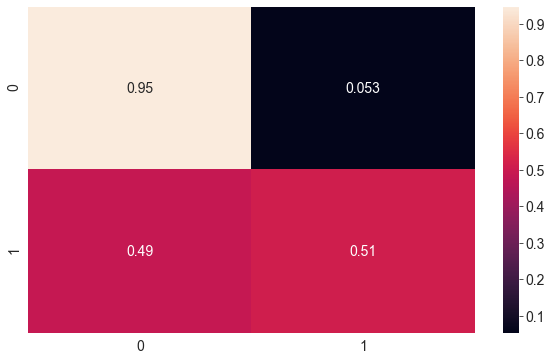

In [432]:
df_cm = pd.DataFrame(cm_array)
train_accuracy_score = accuracy_score(train_targets, train_preds)
print("Accuracy for Train Data: {:.2f}%".format(train_accuracy_score*100))
sns.heatmap(df_cm, annot=True)

Accuracy for test Data: 84.53%


<AxesSubplot:>

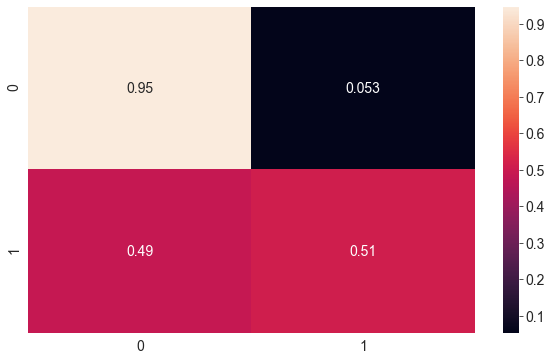

In [433]:
test_preds = model.predict(X_test)
cm_array_test = confusion_matrix(test_targets, test_preds, normalize='true')
test_accuracy_score = accuracy_score(test_targets, test_preds)
print("Accuracy for test Data: {:.2f}%".format(test_accuracy_score*100))
sns.heatmap(df_cm, annot=True)

In [434]:
from sklearn.metrics import classification_report
print(classification_report(test_preds, test_targets))

              precision    recall  f1-score   support

           0       0.94      0.87      0.90     23844
           1       0.50      0.72      0.59      4314

    accuracy                           0.85     28158
   macro avg       0.72      0.79      0.75     28158
weighted avg       0.88      0.85      0.86     28158

